<a href="https://colab.research.google.com/github/DarekGit/FACES_DNN/blob/master/notebooks/05_04_mmdet_DD_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### [Spis treści](https://github.com/DarekGit/FACES_DNN/blob/master/notebooks/Praca_Dyplomowa.ipynb)

[5.4 Uwagi praktyczne](Uwagi_praktyczne.ipynb)

# MMDetection: 
Faster_RCNN,
Faster_RCNN z soft NMS,
Faster_RCNN z soft NMS i zmienionymi anchor box,
SSD300,
Retina 101.

Testy detekcji twarzy na zbiorze FDDB przy użyciu repozytorium mmdetection dla następujących konfiguracji:
<br>Faster_RCNN
<br>Faster_RCNN  z soft NMS
<br>Faster_RCNN z soft NMS i zmienionymi anchor box
<br>SSD300
<br>Retina 101

In [ ]:
!nvidia-smi

Mon Apr 27 13:42:03 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [ ]:
a=!nvidia-smi > nvidia.txt; P100=Flase
for x in a:
    if 'P100'in x: 
      P100=True; break
P100

True

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


#Instalacja repozytoriow

In [ ]:
#pliki FDDB.zip,mmdet_repo.zip mmdet_results.zip mozna sciagnac z https://drive.google.com/open?id=1ApEnn3br2Z2Nt3-0Ve9DKYKMiDkFVpAR

In [ ]:
def repo_to_drive(): #wymaga google drive as drive
  !zip -r mmdet_repo mmdetection/*
  !cp mmdet_repo.zip 'drive/My Drive/Face detection/mmdet_repo.zip'

#mmdet_repo z buildem dla Colaba Z P100
!pip install gdown
import gdown
url = 'https://drive.google.com/uc?export=download&id=1PPmaz_ymOYoMSo4l7quyeqFhsu9vPUjY'
output = 'mmdet_repo.zip'
gdown.download(url, output, False)
!unzip -o mmdet_repo.zip
!rm mmdet_repo.zip

Downloading...
From: https://drive.google.com/uc?export=download&id=1PPmaz_ymOYoMSo4l7quyeqFhsu9vPUjY
To: /content/mmdet_repo.zip
84.5MB [00:00, 110MB/s] 


Archive:  mmdet_repo.zip
   creating: mmdetection/build/
   creating: mmdetection/build/lib.linux-x86_64-3.6/
   creating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/
   creating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/
   creating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/carafe/
  inflating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/carafe/carafe_cuda.cpython-36m-x86_64-linux-gnu.so  
  inflating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/carafe/carafe_naive_cuda.cpython-36m-x86_64-linux-gnu.so  
   creating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/nms/
  inflating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/nms/nms_cuda.cpython-36m-x86_64-linux-gnu.so  
  inflating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/nms/nms_cpu.cpython-36m-x86_64-linux-gnu.so  
   creating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/grid_sampler/
  inflating: mmdetection/build/lib.linux-x86_64-3.6/mmdet/ops/grid_sampler/grid_sampler_cuda.cpython-3

In [ ]:
def work_to_drive(): #wymaga google drive as drive
  !zip -ur mmdet_results work_dirs/ INFO*.* DEBUG*.* result*.* -x work_dirs/*/epoch*
  !cp -f mmdet_results.zip 'drive/My Drive/Face detection/mmdet_results.zip'

#mmdet_results 
!pip install gdown
import gdown
url = 'https://drive.google.com/uc?export=download&id=13yIip_r1qk0JQoAmpiHLoeqgnr1wMpSC'
output = 'mmdet_results.zip'
gdown.download(url, output, False)
!unzip -o mmdet_results.zip
!rm mmdet_results.zip

Downloading...
From: https://drive.google.com/uc?export=download&id=13yIip_r1qk0JQoAmpiHLoeqgnr1wMpSC
To: /content/mmdet_results.zip
939MB [00:13, 67.1MB/s]


Archive:  mmdet_results.zip
   creating: work_dirs/
   creating: work_dirs/faster_rcnn_FDDB/
  inflating: work_dirs/faster_rcnn_FDDB/latest.pth  
  inflating: work_dirs/faster_rcnn_FDDB/None.log.json  
   creating: work_dirs/faster_rcnn_FDDB/tf_logs/
  inflating: work_dirs/faster_rcnn_FDDB/tf_logs/events.out.tfevents.1584944894.fcd584136beb.120.0  
  inflating: INFO.txt                
   creating: work_dirs/faster_rcnn_FDDB_Soft/
  inflating: work_dirs/faster_rcnn_FDDB_Soft/latest.pth  
  inflating: work_dirs/faster_rcnn_FDDB_Soft/None.log.json  
   creating: work_dirs/faster_rcnn_FDDB_Soft/tf_logs/
  inflating: work_dirs/faster_rcnn_FDDB_Soft/tf_logs/events.out.tfevents.1584956540.fcd584136beb.120.1  
  inflating: results.pkl             
   creating: work_dirs/faster_rcnn_FDDB_Soft_Anchor/
  inflating: work_dirs/faster_rcnn_FDDB_Soft_Anchor/latest.pth  
  inflating: work_dirs/faster_rcnn_FDDB_Soft_Anchor/None.log.json  
   creating: work_dirs/faster_rcnn_FDDB_Soft_Anchor/tf_logs/
  

Rozpakowanie danych zbioru FDDB z metrykami i narzedziami, zawiera rowniez wstepnie przygotowane konfiguracje do mmdet

In [ ]:
def FDDB_to_drive(): #wymaga google drive as drive
  !zip -r FDDB FDDB/* 
  !cp FDDB.zip 'drive/My Drive/Face detection/FDDB.zip'
  
!pip install gdown
import gdown
url = 'https://drive.google.com/uc?export=download&id=1--Vm48Sbla2e-edQ8eYfb_gxCnuuMwPL'
output = 'FDDB.zip'
gdown.download(url, output, False)
!unzip -o FDDB.zip
!rm FDDB.zip

In [ ]:
def flib_to_drive(): #wymaga google drive as drive
  !zip -ur flib FDDB/flib/ 
  !cp -f flib.zip 'drive/My Drive/Face detection/flib.zip'


!pip install gdown
import gdown
url = 'https://drive.google.com/uc?export=download&id=1jb8wyp0mMgj0COc7RpLkX4bVH7vxDbmp'
output = 'flib.zip'
gdown.download(url, output, False)
!unzip -o flib.zip
!rm flib.zip

Downloading...
From: https://drive.google.com/uc?export=download&id=1jb8wyp0mMgj0COc7RpLkX4bVH7vxDbmp
To: /content/flib.zip
100%|██████████| 916k/916k [00:00<00:00, 87.7MB/s]


Archive:  flib.zip
  inflating: FDDB/flib/retina_101_32_FDDB.py  
  inflating: FDDB/flib/FDDB_statics.json  
  inflating: FDDB/flib/__pycache__/__init__.cpython-36.pyc  
  inflating: FDDB/flib/__pycache__/fddb.cpython-36.pyc  
  inflating: FDDB/flib/FDDB_metrics.json  
  inflating: FDDB/flib/MTCNN_results.json  
  inflating: FDDB/flib/fddb/fddb.py  
  inflating: FDDB/flib/fddb/__pycache__/__init__.cpython-36.pyc  
  inflating: FDDB/flib/fddb/__pycache__/fddb.cpython-36.pyc  
  inflating: FDDB/flib/fddb/__init__.py  
  inflating: FDDB/flib/mmdet/logger.py  
  inflating: FDDB/flib/mmdet/xml_FDDB.py  
  inflating: FDDB/flib/mmdet/class_names.py  
  inflating: FDDB/flib/mmdet/__init__.py  
  inflating: FDDB/flib/mmdet/voc_eval.py  
  inflating: FDDB/flib/faster_rcnn_FDDB.py  
  inflating: FDDB/flib/faster_rcnn_FDDB_Soft.py  
  inflating: FDDB/flib/ssd300_FDDB.py  


Import metryk dla zbioru FDDB

In [ ]:
import json
with open('FDDB/flib/MTCNN_results.json','r') as f:
  mt_res=json.load(f)
with open('FDDB/flib/FDDB_metrics.json', 'r') as f:
  metrics=json.load(f)
with open('FDDB/flib/FDDB_statics.json','r') as f:
  statics=json.load(f)

FDDB/Annotations dla mmdetection w formacie XML dla dataset XMLFDDB

In [ ]:
def ann_xml(met,dir='FDDB/Annotations/'):
  for i,m in enumerate(met):   
      pref=[
      '<annotation>',
      '    <folder>{}</folder>'.format(m['root']),
      '    <filename>{}</filename>'.format(m['file']),
      '    <size>',
      '        <width>{}</width>'.format(int(m['ori_size'][0])),
      '        <height>{}</height>'.format(int(m['ori_size'][1])),
      '        <depth>{}</depth>'.format(int(m['depth'])),
      '    </size>',
      '    <segmented>0</segmented>',]
      bxs=[]
      for b in m['ebxs']:
        bx=[
      '    <object>',
      '        <name>face</name>',
      '        <pose>Unspecified</pose>',
      '        <truncated>0</truncated>',
      '        <difficult>0</difficult>',
      '        <bndbox>',
      '            <xmin>{}</xmin>'.format(int(b[0])),
      '            <ymin>{}</ymin>'.format(int(b[1])),
      '            <xmax>{}</xmax>'.format(int(b[2])),
      '            <ymax>{}</ymax>'.format(int(b[3])),
      '        </bndbox>',
      '    </object>',]
        bxs+=bx

      suf=[
      '</annotation>',]
      anno=pref+bxs+suf

      file=m['file'].rstrip('.jpg').split('/')[-1]
      if file:
        file+='.xml'
        with open(dir+file,'w') as f:
          for t in anno:
            f.write(t+'\n')
  return  '{} Annotation Files placed in {}'.format(i+1,dir)

!mkdir -p FDDB/Annotations
#ann_xml(metrics) #uzyca w przypadku braku annotation do FDDB FDDB/Annotations/*

Zestawy ann_file (train,val) - ze wzgledu na podkatalogi w FDDB - zawieraja pelna sciezke do pliku ponizej root. Wymagalo modyfikacji ladowania datasets w xml_FDDB. W wider_face uzyto dodatkowego pola folder do odtworzenia sciezki.

In [ ]:
def file_list(met,dir='FDDB/ImageSets/Main/',files=['train.txt','val.txt'],split_r=.1):
  l=len(met); d=int(l*split_r); k=len(files)
  rang=[0]
  for i in range(k):
    rang.append(l-(k-i-1)*d)

  for i,file in enumerate(files): 
    with open(dir+file,'w') as f:
      for m in met[rang[i]:rang[i+1]]:
        t=m['file']
        f.write(t+'\n')
  return '{} placed in {} '.format(files,dir)

!mkdir -p FDDB/ImageSets/Main/
#file_list(metrics) #uzyc w przypadku braku FDDB/ImageSets/Main/* 

# Instalacja MMDet 

!!!   uwaga zajmuje 10 minut, jesli bedzie robiona kompliacja

In [ ]:
#GPU required
%%time

import sys
import os
if not '/content/FDDB' in sys.path : sys.path.append('/content/FDDB')
from flib import fddb as F
from PIL.ImageOps import Image

import torch
import numpy
!pip install mmcv
!pip install terminaltables

if not os.path.exists('mmdetection/'):
    mmdetection_repo = 'https://github.com/open-mmlab/mmdetection'
    !git clone -q {mmdetection_repo}
    #!cd mmdetection && git reset --hard 93bed07 ## git log cd mmdetection

    !cp FDDB/flib/mmdet/__init__.py mmdetection/mmdet/datasets/
    !cp FDDB/flib/mmdet/xml_FDDB.py mmdetection/mmdet/datasets
    !cp FDDB/flib/mmdet/voc_eval.py mmdetection/tools/
    !cp FDDB/flib/mmdet/logger.py mmdetection/mmdet/core/evaluation/
    !cp FDDB/flib/mmdet/class_names.py mmdetection/mmdet/utils

    !cd mmdetection/ && pip install -q -r requirements.txt
    !cd mmdetection/ && python setup.py develop 


if not '/content/mmdetection' in os.environ.get('PYTHONPATH'):
  os.environ.update({'PYTHONPATH': os.environ.get('PYTHONPATH')+':/content/mmdetection'})
if not '/content/mmdetection' in sys.path : sys.path.append('/content/mmdetection')

     |████████████████████████████████| 61kB 3.2MB/s 
  Created wheel for mmcv: filename=mmcv-0.4.0-cp36-cp36m-linux_x86_64.whl size=170343 sha256=944c17122d7a5ebeb1f432ddfd4ed5169c869ccfd298f318babd65a6c2da47a3
  Stored in directory: /root/.cache/pip/wheels/41/17/b4/8ee4db2676c0e18f70a8afda314f5d809bd014ea795915b560
Successfully built mmcv
  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp36-none-any.whl size=15356 sha256=2722c048a81ea56d7b10bab861158e8eab1a071d293b2efac9738de81de01921
  Stored in directory: /root/.cache/pip/wheels/30/6b/50/6c75775b681fb36cdfac7f19799888ef9d8813aff9e379663e
Successfully built terminaltables
CPU times: user 354 ms, sys: 106 ms, total: 460 ms
Wall time: 18.9 s


# Wykorzystanie MMDet

## Import modułów

In [ ]:
from __future__ import division
import argparse
import os

import torch
from mmcv import Config

from mmdet import __version__
from mmdet.apis import (get_root_logger, set_random_seed, # TODO: init_dist
                        train_detector)
                        
from mmdet.datasets import build_dataset
from mmdet.models import build_detector

In [ ]:
import cv2
def result_plot(m,cfg=None,figsize=(14,14),marks=True):
    det=True if 'dbxs' in m.keys() else False
    if not det:
      img = cv2.cvtColor(cv2.imread(m['path']), cv2.COLOR_BGR2RGB)
      F.plot_marks(img,m,cfg=cfg,figsize=figsize)
    else: 
      if not cfg: cfg={'cells': {'FDDB/marks':'Marks','FDDB/ebxs': 'Extrapolated Boxes', 'dbxs': 'Detected'},
                      'colors': [ ('green',1),('white', 1), ('red', 2), ('blue', 1)],
                      'ellips': ['e','ab','rb'],
                      'figsize': (14, 14),
                      'title': 'True'}
      if not marks: cfg['ellips']=[]
      img = cv2.cvtColor(cv2.imread(m['FDDB']['path']), cv2.COLOR_BGR2RGB)
      F.plot_marks(img,m,det=True,cfg=cfg,figsize=figsize)

 \Ellipses , \Rotated boxes , \Annotated boxes , Extrapolated Boxes ,

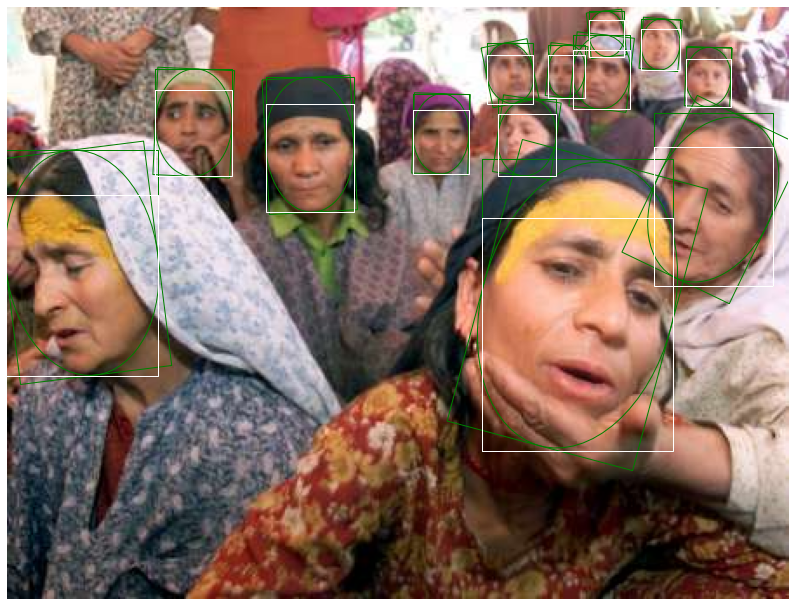

 \Ellipses , \Rotated boxes , \Annotated boxes , Extrapolated Boxes , Detected Boxes ,

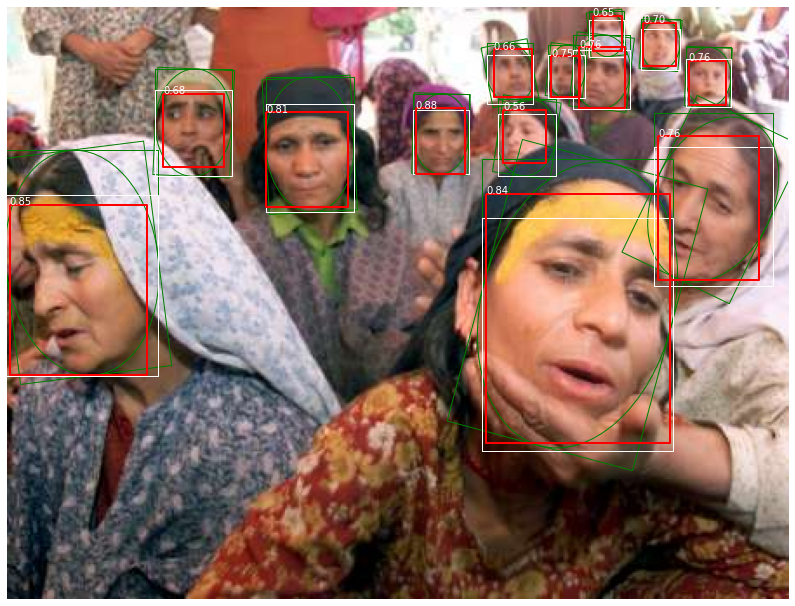

In [ ]:
result_plot(metrics[0])
result_plot(mt_res[0])

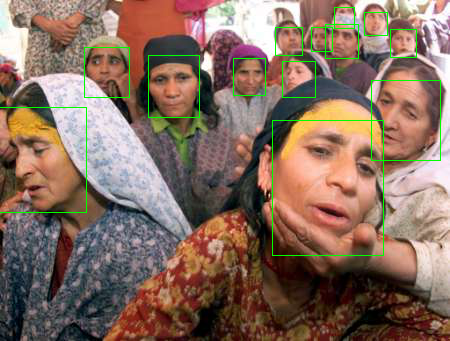

In [ ]:
img=F.Img(metrics[0]['path'])
F.draw_boxes(img,metrics[0]['ebxs'])

In [ ]:
from mmdet.apis import init_detector, inference_detector, show_result
import mmcv,cv2
from google.colab.patches import cv2_imshow
def cv2_im(atr='',img=None):
  cv2_imshow(img)
cv2.imshow=cv2_im

def show_video(file='IMG.mp4',config_file = 'FDDB/flib_F/ssd300_FDDB.py',checkpoint_file = 'work_dirs/ssd300_FDDB/latest.pth'):
  model = init_detector(config_file, checkpoint_file, device='cuda:0')
  model.CLASSES=('face',)

  video = mmcv.VideoReader(file)
  for i,frame in enumerate(video):
      if not i%20:
        result = inference_detector(model, frame)
        show_result(frame, result, model.CLASSES, wait_time=1)
        cv2.destroyAllWindows()

#faster_rcnn_FDDB.py

### Wczytanie pliku konfiguracyjnego 

In [ ]:
cfg = Config.fromfile('FDDB/flib/faster_rcnn_FDDB.py')

# ustawienie cudnn_benchmark
if cfg.get('cudnn_benchmark', False):
    torch.backends.cudnn.benchmark = True # https://discuss.pytorch.org/t/what-does-torch-backends-cudnn-benchmark-do/5936

In [ ]:
for x in cfg:
  print('*'*80,'\n',x,' : ',cfg[x],'\n')

******************************************************************************** 
 model  :  {'type': 'FasterRCNN', 'pretrained': 'torchvision://resnet50', 'backbone': {'type': 'ResNet', 'depth': 50, 'num_stages': 4, 'out_indices': (0, 1, 2, 3), 'frozen_stages': 1, 'style': 'pytorch'}, 'neck': {'type': 'FPN', 'in_channels': [256, 512, 1024, 2048], 'out_channels': 256, 'num_outs': 5}, 'rpn_head': {'type': 'RPNHead', 'in_channels': 256, 'feat_channels': 256, 'anchor_scales': [8], 'anchor_ratios': [0.5, 1.0, 2.0], 'anchor_strides': [4, 8, 16, 32, 64], 'target_means': [0.0, 0.0, 0.0, 0.0], 'target_stds': [1.0, 1.0, 1.0, 1.0], 'loss_cls': {'type': 'CrossEntropyLoss', 'use_sigmoid': True, 'loss_weight': 1.0}, 'loss_bbox': {'type': 'SmoothL1Loss', 'beta': 0.1111111111111111, 'loss_weight': 1.0}}, 'bbox_roi_extractor': {'type': 'SingleRoIExtractor', 'roi_layer': {'type': 'RoIAlign', 'out_size': 7, 'sample_num': 2}, 'out_channels': 256, 'featmap_strides': [4, 8, 16, 32]}, 'bbox_head': {'type': 

In [ ]:
cfg.img_norm_cfg

{'mean': [113.649, 102.085, 94.887],
 'std': [76.238, 71.515, 70.974],
 'to_rgb': True}

In [ ]:
cfg.log_level

'INFO.txt'

In [ ]:
# inicjalizacja loggera
distributed = False # niestety w Colabie nie będzie distributed
logger = get_root_logger( cfg.log_level)
logger.info('Distributed training: {}'.format(distributed))


2020-03-23 06:27:45,714 - mmdet - INFO - Distributed training: False


In [ ]:
import logging
#logger.handlers=[logging.FileHandler('INFO.txt', 'w')]
logger.__dict__, logging.INFO

({'disabled': False,
  'filters': [],
  'handlers': [<FileHandler /content/INFO.txt (INFO)>],
  'level': 0,
  'manager': <logging.Manager at 0x7f2c93ac5d30>,
  'name': 'mmdet',
  'parent': <RootLogger root (INFO)>,
  'propagate': True},
 20)

### model

In [ ]:
model = build_detector(
        cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)

2020-03-23 06:27:46,269 - mmdet - INFO - load model from: torchvision://resnet50
Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


2020-03-23 06:27:48,163 - mmdet - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias



### Zamrożenie sieci z wyłączeniem "główek"

In [ ]:
m = next(model.modules())
for p in m.children():
    if p._get_name() not in ['SharedFCBBoxHead','RPNHead']:  #wlaczona druga glówka
        p.requires_grad_(False)
    else:
        p.requires_grad_(True)

### Stworzenie datasetu, ustawienie klas modelu i trenowanie

In [ ]:
datasets = [build_dataset(cfg.data.train)]
#datasets.append(build_dataset(cfg.data.test)) # niestety niedostępna walidacja w trybie non-distributed  

In [ ]:
train_detector(
    model,
    datasets,
    cfg,
    distributed=False,
    validate=False)
work_to_drive()

2020-03-23 06:28:12,888 - mmdet - INFO - Start running, host: root@fcd584136beb, work_dir: /content/work_dirs/faster_rcnn_FDDB
2020-03-23 06:28:12,890 - mmdet - INFO - workflow: [('train', 1)], max: 40 epochs


2020-03-23 06:28:20,452 - mmdet - INFO - Epoch [1][6/321]	lr: 0.00170, eta: 3:37:35, time: 1.017, data_time: 0.096, memory: 4378, loss_rpn_cls: 0.6860, loss_rpn_bbox: 0.0130, loss_cls: 0.2794, acc: 94.8486, loss_bbox: 0.0327, loss: 1.0112
2020-03-23 06:28:25,575 - mmdet - INFO - Epoch [1][12/321]	lr: 0.00174, eta: 3:20:01, time: 0.854, data_time: 0.026, memory: 4378, loss_rpn_cls: 0.6473, loss_rpn_bbox: 0.0092, loss_cls: 0.0735, acc: 98.5555, loss_bbox: 0.0280, loss: 0.7580
2020-03-23 06:28:30,640 - mmdet - INFO - Epoch [1][18/321]	lr: 0.00178, eta: 3:13:25, time: 0.844, data_time: 0.025, memory: 4378, loss_rpn_cls: 0.5848, loss_rpn_bbox: 0.0119, loss_cls: 0.1118, acc: 98.0998, loss_bbox: 0.0402, loss: 0.7487
2020-03-23 06:28:35,816 - mmdet - INFO - Epoch [1][24/321]	lr: 0.00182, eta: 3:11:04, time: 0.863, data_time: 0.025, memory: 4378, loss_rpn_cls: 0.5001, loss_rpn_bbox: 0.0118, loss_cls: 0.1456, acc: 97.6969, loss_bbox: 0.0515, loss: 0.7089
2020-03-23 06:28:41,005 - mmdet - INFO - 

	zip warning: mmdet_results.zip not found or empty
	zip warning: name not matched: DEBUG*.*
	zip warning: name not matched: result*.*
  adding: work_dirs/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB/latest.pth (deflated 8%)
  adding: work_dirs/faster_rcnn_FDDB/None.log.json (deflated 86%)
  adding: work_dirs/faster_rcnn_FDDB/tf_logs/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB/tf_logs/events.out.tfevents.1584944894.fcd584136beb.120.0 (deflated 70%)
  adding: INFO.txt (deflated 85%)


### Wizualizacja działania modelu

In [ ]:
!python /content/mmdetection/tools/analyze_logs.py plot_curve work_dirs/faster_rcnn_FDDB/None.log.json  --keys loss_bbox --legend run1

plot curve of work_dirs/faster_rcnn_FDDB/None.log.json, metric is loss_bbox
<Figure size 640x480 with 1 Axes>


/content/mmdetection/mmdet/apis/inference.py:40: UserWarning: Class names are not saved in the checkpoint's meta data, use FDDB classes by default.
  warnings.warn('Class names are not saved in the checkpoint\'s '


 Extrapolated Boxes , Detected Boxes ,

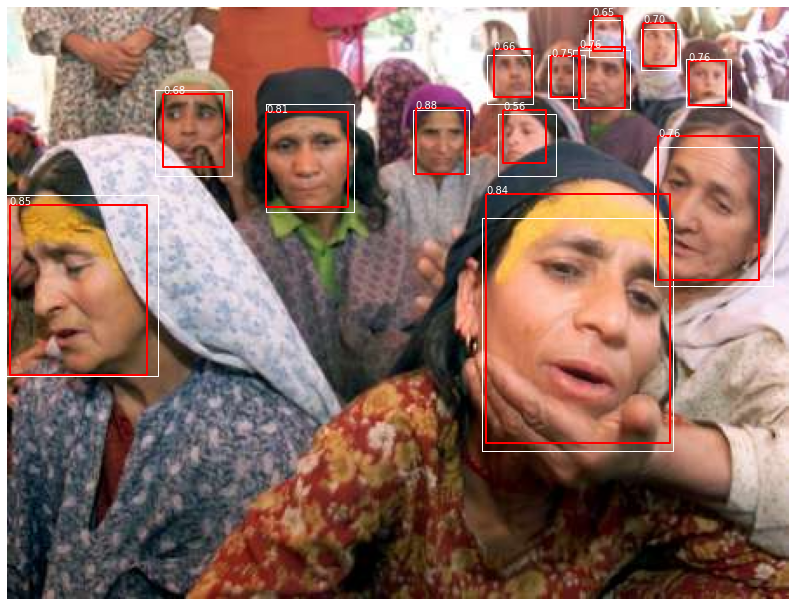

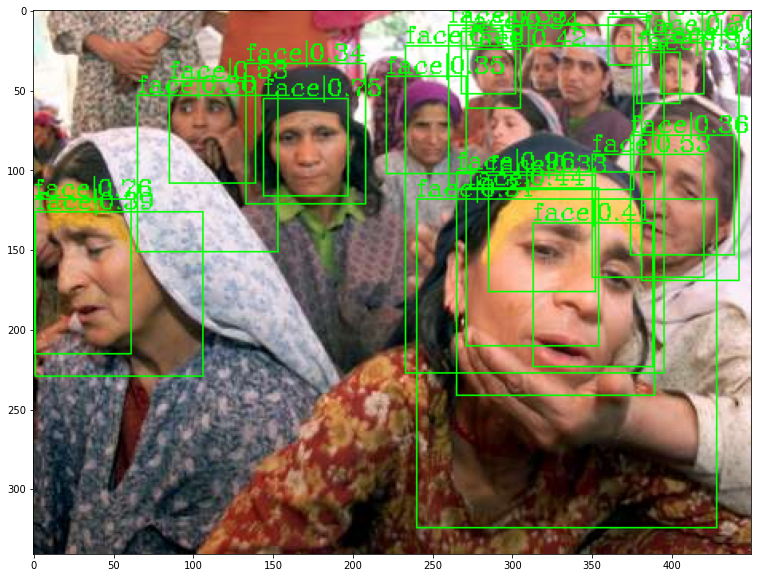

In [ ]:
i=0
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
config_file = 'FDDB/flib/faster_rcnn_FDDB.py' # lub wcześniejsze cfg
checkpoint_file = 'work_dirs/faster_rcnn_FDDB/latest.pth'
img_path = metrics[i]['path']

detection_model = init_detector(cfg, checkpoint_file, device='cuda:0')
detection_model.CLASSES = datasets[0].CLASSES
result = inference_detector(detection_model, img_path)

result_plot(mt_res[i],marks=False)
show_result_pyplot(img_path, result, datasets[0].CLASSES)

In [ ]:
show_video(file='IMG.mp4',config_file=config_file,checkpoint_file=checkpoint_file)

###ograniczenie ilosci wykrytych boksow przez zmiane progu

In [ ]:
cfg.test_cfg.rcnn.nms.iou_thr=0.2

/content/mmdetection/mmdet/apis/inference.py:40: UserWarning: Class names are not saved in the checkpoint's meta data, use FDDB classes by default.
  warnings.warn('Class names are not saved in the checkpoint\'s '


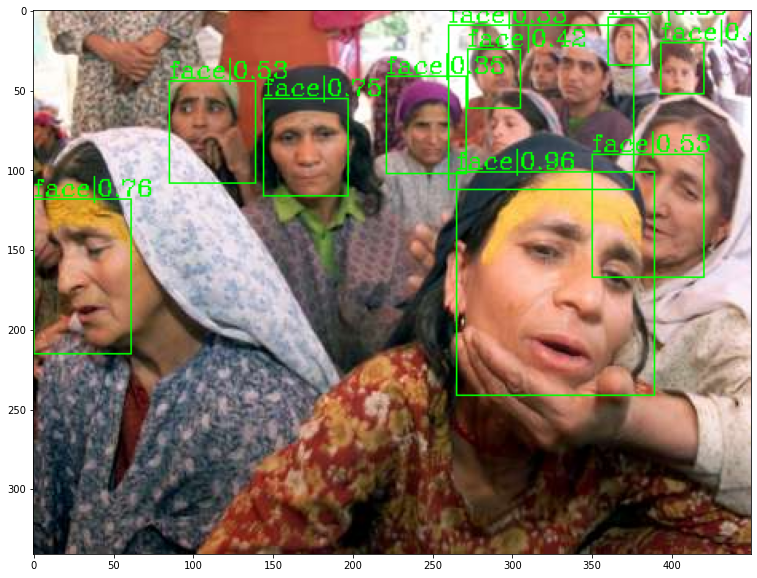

In [ ]:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
config_file = 'FDDB/flib/faster_rcnn_FDDB.py' # lub wcześniejsze cfg
checkpoint_file = 'work_dirs/faster_rcnn_FDDB/latest.pth'
img_path = 'FDDB/2002/07/26/big/img_1010.jpg'

detection_model = init_detector(cfg, checkpoint_file, device='cuda:0')
detection_model.CLASSES = datasets[0].CLASSES
result = inference_detector(detection_model, img_path)

show_result_pyplot(img_path, result, datasets[0].CLASSES)

Detected faces with mtcnn :  13
 \Ellipses , \Rotated boxes , \Annotated boxes , Extrapolated Boxes , Detected Boxes ,

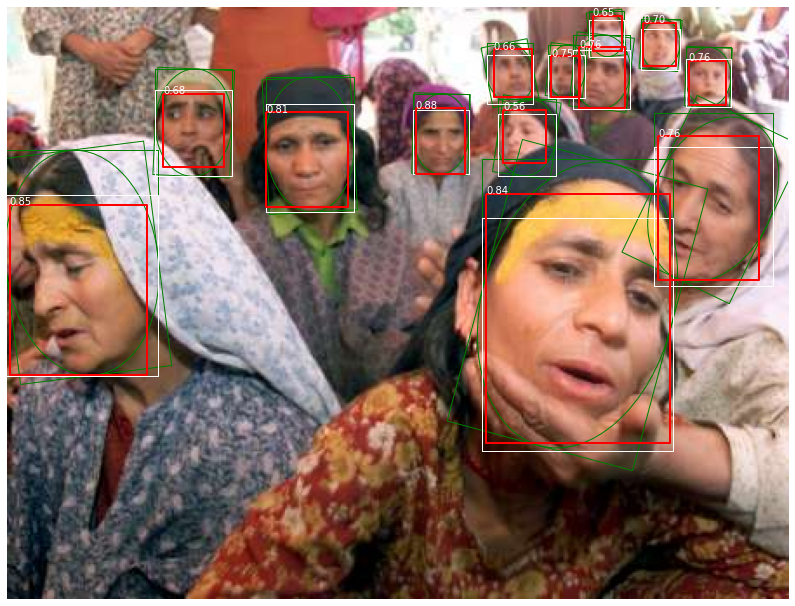

In [ ]:
i=0
print("Detected faces with mtcnn : ",len(mt_res[i]['dbxs']))
result_plot(mt_res[i],figsize=(10,10))

### Ewaluacja


konieczna zmiana w voc_eval.py logger=None
mozna tez zmienic w logger ( or logger == 'print')

In [ ]:
!python mmdetection/tools/test.py  FDDB/flib/faster_rcnn_FDDB.py work_dirs/faster_rcnn_FDDB/latest.pth --out results.pkl
!python mmdetection/tools/voc_eval.py results.pkl FDDB/flib/faster_rcnn_FDDB.py

[>>] 284/284, 13.1 task/s, elapsed: 22s, ETA:     0s
writing results to results.pkl

+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 13233 | 0.882  | 0.741 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.741 |
+-------+-----+-------+--------+-------+


In [ ]:
'''
+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 12053 | 0.884  | 0.755 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.755 |
+-------+-----+-------+--------+-------+
'''

# Faster_RCNN Soft-NMS


In [ ]:
'''
# model settings Soft
...
test_cfg = dict(
...
        score_thr=0.05, nms=dict(type='soft_nms', iou_thr=0.5, min_score=0.05), max_per_img=100)

'''

In [ ]:
cfg = Config.fromfile('FDDB/flib/faster_rcnn_FDDB_Soft.py')

# ustawienie cudnn_benchmark
if cfg.get('cudnn_benchmark', False):
    torch.backends.cudnn.benchmark = True # https://discuss.pytorch.org/t/what-does-torch-backends-cudnn-benchmark-do/5936



In [ ]:
model = build_detector(
        cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)
m = next(model.modules())
for p in m.children():
    if p._get_name() not in ['SharedFCBBoxHead','RPNHead']:  #wlaczona druga glówka
        p.requires_grad_(False)
    else:
        p.requires_grad_(True)

2020-03-23 09:39:48,383 - mmdet - INFO - load model from: torchvision://resnet50
2020-03-23 09:39:51,344 - mmdet - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias



In [ ]:
datasets = [build_dataset(cfg.data.train)]
#datasets.append(build_dataset(cfg.data.test)) # niestety niedostępna walidacja w trybie non-distributed  

In [ ]:
train_detector(
    model,
    datasets,
    cfg,
    distributed=False,
    validate=False)
work_to_drive()

2020-03-23 09:42:20,316 - mmdet - INFO - Start running, host: root@fcd584136beb, work_dir: /content/work_dirs/faster_rcnn_FDDB_Soft
2020-03-23 09:42:20,322 - mmdet - INFO - workflow: [('train', 1)], max: 40 epochs
2020-03-23 09:42:26,176 - mmdet - INFO - Epoch [1][6/321]	lr: 0.00170, eta: 3:28:19, time: 0.974, data_time: 0.103, memory: 5489, loss_rpn_cls: 0.7060, loss_rpn_bbox: 0.0101, loss_cls: 0.2130, acc: 96.0205, loss_bbox: 0.0055, loss: 0.9346
2020-03-23 09:42:31,629 - mmdet - INFO - Epoch [1][12/321]	lr: 0.00174, eta: 3:21:15, time: 0.909, data_time: 0.027, memory: 5489, loss_rpn_cls: 0.6649, loss_rpn_bbox: 0.0088, loss_cls: 0.0231, acc: 99.5565, loss_bbox: 0.0034, loss: 0.7002
2020-03-23 09:42:37,220 - mmdet - INFO - Epoch [1][18/321]	lr: 0.00178, eta: 3:20:29, time: 0.932, data_time: 0.030, memory: 5489, loss_rpn_cls: 0.6010, loss_rpn_bbox: 0.0097, loss_cls: 0.0586, acc: 99.1211, loss_bbox: 0.0154, loss: 0.6847
2020-03-23 09:42:42,273 - mmdet - INFO - Epoch [1][24/321]	lr: 0.00

	zip warning: name not matched: DEBUG*.*
updating: work_dirs/ (stored 0%)
updating: INFO.txt (deflated 85%)
  adding: work_dirs/faster_rcnn_FDDB_Soft/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB_Soft/latest.pth (deflated 8%)
  adding: work_dirs/faster_rcnn_FDDB_Soft/None.log.json (deflated 86%)
  adding: work_dirs/faster_rcnn_FDDB_Soft/tf_logs/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB_Soft/tf_logs/events.out.tfevents.1584956540.fcd584136beb.120.1 (deflated 70%)
  adding: results.pkl (deflated 24%)


In [ ]:
!python mmdetection/tools/test.py  FDDB/flib/faster_rcnn_FDDB_Soft.py work_dirs/faster_rcnn_FDDB_Soft/latest.pth --out resultsS.pkl
!python mmdetection/tools/voc_eval.py resultsS.pkl FDDB/flib/faster_rcnn_FDDB_Soft.py

[>>] 284/284, 12.6 task/s, elapsed: 23s, ETA:     0s
writing results to resultsS.pkl

+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 14510 | 0.895  | 0.744 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.744 |
+-------+-----+-------+--------+-------+


In [ ]:
'''
+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 13855 | 0.887  | 0.746 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.746 |
+-------+-----+-------+--------+-------+
'''

# Fastr-RCNN - dopasowanie Anchor Boxes

In [ ]:
import numpy as np
import glob
import pandas as pd
import xml.etree.ElementTree as ET

anno_path = os.path.join('FDDB', "Annotations")


def get_class_names():
    classes_names = []
    aspect_ratios =[]
    xml_list = []
    for xml_file in glob.glob(anno_path + "/*.xml"):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall("object"):
            classes_names.append(member[0].text)
            aspect_ratios.append((int(member[4][2].text)-int(member[4][0].text))/(int(member[4][3].text)-int(member[4][1].text)))


    classes_names = list(set(classes_names))
    classes_names.sort()
    return classes_names, aspect_ratios

classes_names,aspect_ratios = get_class_names()
classes_names, np.mean(aspect_ratios)

(['face'], 0.8342442499757511)

In [ ]:
cfg.model.rpn_head.anchor_ratios

[0.5, 1.0, 2.0]

In [ ]:
cfg = Config.fromfile('FDDB/flib/faster_rcnn_FDDB_Soft.py')

# ustawienie cudnn_benchmark
if cfg.get('cudnn_benchmark', False):
    torch.backends.cudnn.benchmark = True # https://discuss.pytorch.org/t/what-does-torch-backends-cudnn-benchmark-do/5936

cfg.work_dir+='_Anchor'

In [ ]:
cfg.model.rpn_head.anchor_ratios = [0.6,0.83,1.]
cfg.model.rpn_head.anchor_ratios

[0.6, 0.83, 1.0]

In [ ]:
model = build_detector(
        cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)
m = next(model.modules())
for p in m.children():
    if p._get_name() not in ['SharedFCBBoxHead','RPNHead']:  #wlaczona druga glówka
        p.requires_grad_(False)
    else:
        p.requires_grad_(True)

2020-03-23 12:53:47,871 - mmdet - INFO - load model from: torchvision://resnet50
2020-03-23 12:53:48,209 - mmdet - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias



In [ ]:
datasets = [build_dataset(cfg.data.train)]
#datasets.append(build_dataset(cfg.data.test)) # niestety niedostępna walidacja w trybie non-distributed  

In [ ]:
train_detector(
    model,
    datasets,
    cfg,
    distributed=False,
    validate=False)
work_to_drive()

2020-03-23 12:54:56,480 - mmdet - INFO - Start running, host: root@fcd584136beb, work_dir: /content/work_dirs/faster_rcnn_FDDB_Soft_Anchor
2020-03-23 12:54:56,482 - mmdet - INFO - workflow: [('train', 1)], max: 40 epochs
2020-03-23 12:55:02,196 - mmdet - INFO - Epoch [1][6/321]	lr: 0.00170, eta: 3:23:24, time: 0.951, data_time: 0.096, memory: 5804, loss_rpn_cls: 0.6820, loss_rpn_bbox: 0.0088, loss_cls: 0.2583, acc: 94.9219, loss_bbox: 0.0120, loss: 0.9611
2020-03-23 12:55:07,647 - mmdet - INFO - Epoch [1][12/321]	lr: 0.00174, eta: 3:18:46, time: 0.908, data_time: 0.028, memory: 5804, loss_rpn_cls: 0.6412, loss_rpn_bbox: 0.0138, loss_cls: 0.0634, acc: 98.8241, loss_bbox: 0.0245, loss: 0.7429
2020-03-23 12:55:13,082 - mmdet - INFO - Epoch [1][18/321]	lr: 0.00178, eta: 3:16:58, time: 0.906, data_time: 0.026, memory: 5804, loss_rpn_cls: 0.5754, loss_rpn_bbox: 0.0105, loss_cls: 0.0899, acc: 98.4660, loss_bbox: 0.0320, loss: 0.7078
2020-03-23 12:55:18,173 - mmdet - INFO - Epoch [1][24/321]	l

	zip warning: name not matched: DEBUG*.*
updating: work_dirs/ (stored 0%)
updating: INFO.txt (deflated 85%)
  adding: work_dirs/faster_rcnn_FDDB_Soft_Anchor/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB_Soft_Anchor/latest.pth (deflated 8%)
  adding: work_dirs/faster_rcnn_FDDB_Soft_Anchor/None.log.json (deflated 86%)
  adding: work_dirs/faster_rcnn_FDDB_Soft_Anchor/tf_logs/ (stored 0%)
  adding: work_dirs/faster_rcnn_FDDB_Soft_Anchor/tf_logs/events.out.tfevents.1584968096.fcd584136beb.120.2 (deflated 70%)
  adding: resultsS.pkl (deflated 23%)


/content/mmdetection/mmdet/apis/inference.py:40: UserWarning: Class names are not saved in the checkpoint's meta data, use FDDB classes by default.
  warnings.warn('Class names are not saved in the checkpoint\'s '


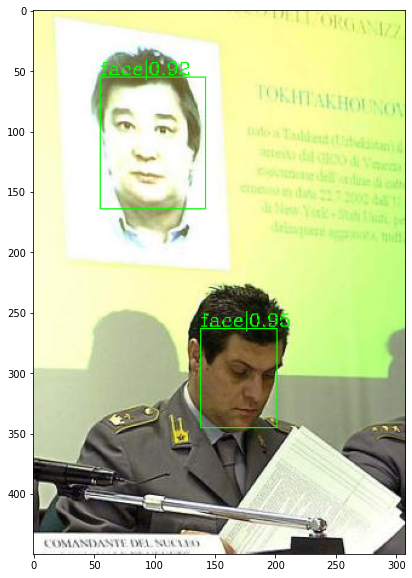

In [ ]:
cfg.test_cfg.rcnn.nms.iou_thr=0.2
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
config_file = 'FDDB/flib/faster_rcnn_FDDB_Soft.py' # lub wcześniejsze cfg
checkpoint_file = 'work_dirs/faster_rcnn_FDDB_Soft_Anchor/latest.pth'
img_path = metrics[85]['path']

detection_model = init_detector(cfg, checkpoint_file, device='cuda:0')
#detection_model.CLASSES = datasets[0].CLASSES
result = inference_detector(detection_model, img_path)

show_result_pyplot(img_path, result, datasets[0].CLASSES)

 \Ellipses , \Rotated boxes , \Annotated boxes , Extrapolated Boxes , Detected Boxes ,

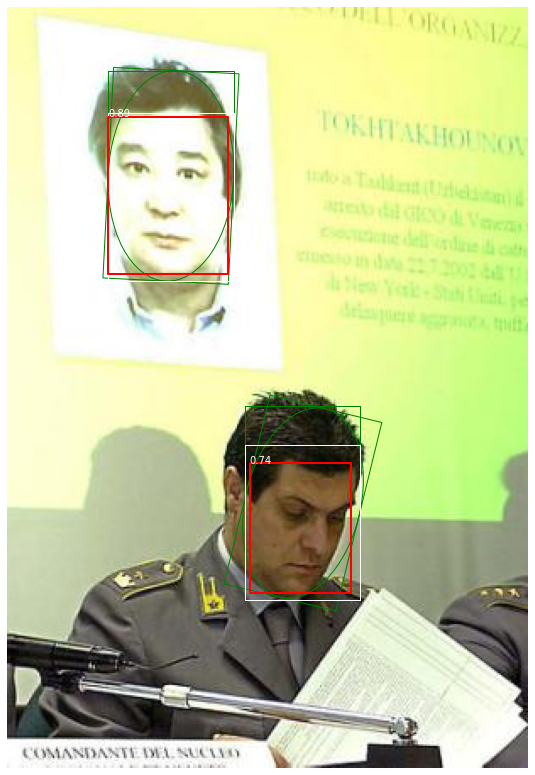

In [ ]:
result_plot(mt_res[85])

In [ ]:
!python mmdetection/tools/test.py  FDDB/flib/faster_rcnn_FDDB_Soft.py work_dirs/faster_rcnn_FDDB_Soft_Anchor/latest.pth --out resultsSA.pkl
!python mmdetection/tools/voc_eval.py resultsSA.pkl FDDB/flib/faster_rcnn_FDDB_Soft.py

[>>] 284/284, 12.9 task/s, elapsed: 22s, ETA:     0s
writing results to resultsSA.pkl

+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 17463 | 0.866  | 0.689 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.689 |
+-------+-----+-------+--------+-------+


In [ ]:
'''
+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 16347 | 0.857  | 0.681 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.681 |
+-------+-----+-------+--------+-------+
'''

#SSD300 model


SSD: https://github.com/open-mmlab/mmdetection/blob/master/configs/ssd300_coco.py

In [ ]:
cfg = Config.fromfile('FDDB/flib/ssd300_FDDB.py') # <-- późniejsze zadanie

# ustawienie cudnn_benchmark
if cfg.get('cudnn_benchmark', False):
    torch.backends.cudnn.benchmark = True # https://discuss.pytorch.org/t/what-does-torch-backends-cudnn-benchmark-do/5936


In [ ]:
cfg

Config (path: FDDB/flib/ssd300_FDDB.py): {'input_size': 300, 'model': {'type': 'SingleStageDetector', 'pretrained': 'open-mmlab://vgg16_caffe', 'backbone': {'type': 'SSDVGG', 'input_size': 300, 'depth': 16, 'with_last_pool': False, 'ceil_mode': True, 'out_indices': (3, 4), 'out_feature_indices': (22, 34), 'l2_norm_scale': 20}, 'neck': None, 'bbox_head': {'type': 'SSDHead', 'input_size': 300, 'in_channels': (512, 1024, 512, 256, 256, 256), 'num_classes': 2, 'anchor_strides': (8, 16, 32, 64, 100, 300), 'basesize_ratio_range': (0.15, 0.9), 'anchor_ratios': ([2], [2, 3], [2, 3], [2, 3], [2], [2]), 'target_means': (0.0, 0.0, 0.0, 0.0), 'target_stds': (0.1, 0.1, 0.2, 0.2)}}, 'cudnn_benchmark': True, 'train_cfg': {'assigner': {'type': 'MaxIoUAssigner', 'pos_iou_thr': 0.5, 'neg_iou_thr': 0.5, 'min_pos_iou': 0.0, 'ignore_iof_thr': -1, 'gt_max_assign_all': False}, 'smoothl1_beta': 1.0, 'allowed_border': -1, 'pos_weight': -1, 'neg_pos_ratio': 3, 'debug': False}, 'test_cfg': {'nms': {'type': 'nms'

In [ ]:
# inicjalizacja loggera
distributed = False # niestety w Colabie nie będzie distributed
logger = get_root_logger(cfg.log_level)
logger.info('Distributed training: {}'.format(distributed))

2020-03-23 16:07:48,884 - mmdet - INFO - Distributed training: False


In [ ]:
model = build_detector(
        cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)

2020-03-23 16:07:55,245 - mmdet - INFO - load model from: open-mmlab://vgg16_caffe
Downloading: "https://s3.ap-northeast-2.amazonaws.com/open-mmlab/pretrain/third_party/vgg16_caffe-292e1171.pth" to /root/.cache/torch/checkpoints/vgg16_caffe-292e1171.pth


2020-03-23 16:08:06,352 - mmdet - WARNING - The model and loaded state dict do not match exactly

missing keys in source state_dict: extra.0.weight, extra.0.bias, extra.1.weight, extra.1.bias, extra.2.weight, extra.2.bias, extra.3.weight, extra.3.bias, extra.4.weight, extra.4.bias, extra.5.weight, extra.5.bias, extra.6.weight, extra.6.bias, extra.7.weight, extra.7.bias, l2_norm.weight



In [ ]:
model

SingleStageDetector(
  (backbone): SSDVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=Tr

In [ ]:
m = next(model.modules())
for p in m.children():
    print(p._get_name())

SSDVGG
SSDHead


In [ ]:
m = next(model.modules())
for p in m.children():
    if p._get_name() not in ['SSDHead']: 
        p.requires_grad_(False)
    else:
        p.requires_grad_(True)

In [ ]:
datasets = [build_dataset(cfg.data.train)]
#datasets.append(build_dataset(cfg.data.test)) # niestety niedostępna walidacja w trybie non-distributed  

In [ ]:
model.CLASSES = datasets[0].CLASSES
train_detector(
    model,
    datasets,
    cfg,
    distributed=False,
    validate=False)
work_to_drive()

2020-03-23 16:09:15,936 - mmdet - INFO - Start running, host: root@fcd584136beb, work_dir: /content/work_dirs/ssd300_FDDB
2020-03-23 16:09:15,938 - mmdet - INFO - workflow: [('train', 1)], max: 200 epochs
2020-03-23 16:09:26,641 - mmdet - INFO - Epoch [1][5/55]	lr: 0.00406, eta: 6:31:43, time: 2.138, data_time: 0.218, memory: 12063, loss_cls: 14.3973, loss_bbox: 2.8824, loss: 17.2798
2020-03-23 16:09:31,622 - mmdet - INFO - Epoch [1][10/55]	lr: 0.00414, eta: 4:47:00, time: 0.996, data_time: 0.076, memory: 12063, loss_cls: 34.6938, loss_bbox: 2.7128, loss: 37.4065
2020-03-23 16:09:36,829 - mmdet - INFO - Epoch [1][15/55]	lr: 0.00422, eta: 4:14:48, time: 1.042, data_time: 0.081, memory: 12063, loss_cls: 43.6314, loss_bbox: 2.6978, loss: 46.3292
2020-03-23 16:09:41,941 - mmdet - INFO - Epoch [1][20/55]	lr: 0.00430, eta: 3:57:47, time: 1.022, data_time: 0.082, memory: 12063, loss_cls: 42.1033, loss_bbox: 2.7666, loss: 44.8699
2020-03-23 16:09:47,313 - mmdet - INFO - Epoch [1][25/55]	lr: 0.

	zip warning: name not matched: DEBUG*.*
updating: work_dirs/ (stored 0%)
updating: INFO.txt (deflated 85%)
  adding: work_dirs/ssd300_FDDB/ (stored 0%)
  adding: work_dirs/ssd300_FDDB/latest.pth (deflated 7%)
  adding: work_dirs/ssd300_FDDB/None.log.json (deflated 86%)
  adding: work_dirs/ssd300_FDDB/tf_logs/ (stored 0%)
  adding: work_dirs/ssd300_FDDB/tf_logs/events.out.tfevents.1584979755.fcd584136beb.120.3 (deflated 69%)
  adding: resultsSA.pkl (deflated 23%)


In [ ]:
print(statics['Min_faces_8'])

[[27, 730], [22, 2548], [15, 2751], [15, 494], [15, 106], [13, 2089], [13, 0], [12, 2806], [11, 2445], [11, 729], [10, 2637], [10, 2301], [10, 1404], [10, 1317], [10, 1096], [10, 1065], [10, 257], [10, 19], [9, 2778], [9, 2613], [9, 2200], [9, 2084], [9, 1551], [9, 863], [9, 279]]


/content/mmdetection/mmdet/apis/inference.py:40: UserWarning: Class names are not saved in the checkpoint's meta data, use FDDB classes by default.
  warnings.warn('Class names are not saved in the checkpoint\'s '


 \Ellipses , \Rotated boxes , \Annotated boxes , Extrapolated Boxes , Detected Boxes ,

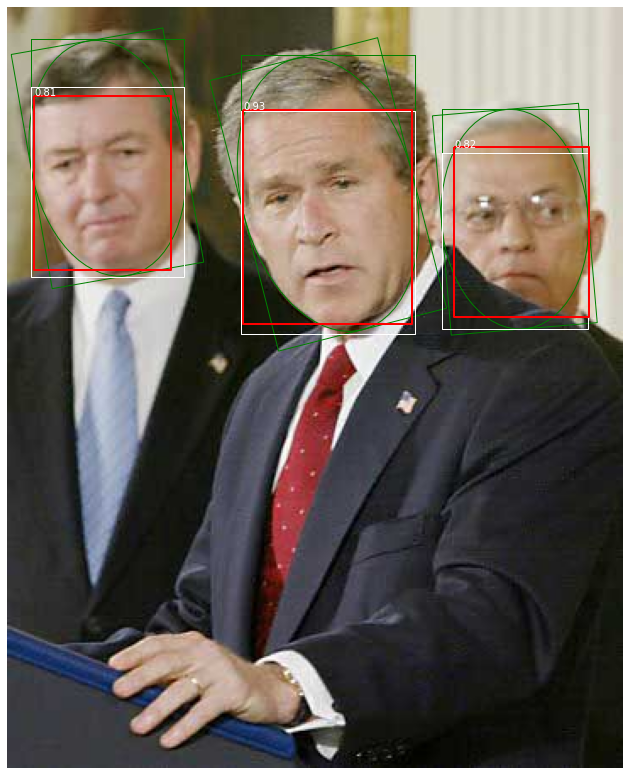

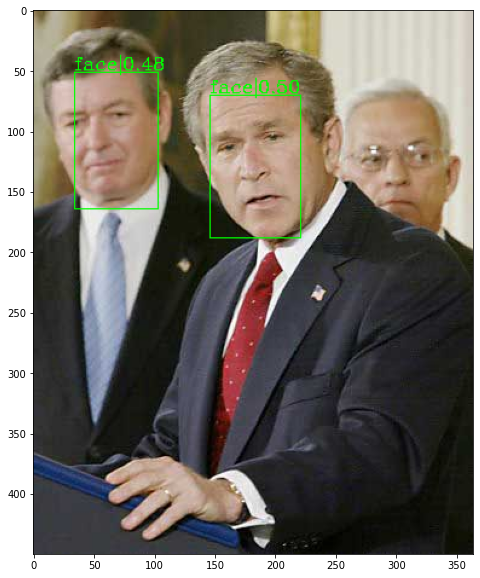

In [ ]:
cfg.test_cfg.nms.iou_thr=0.2
i=6
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
config_file = 'FDDB/flib/ssd300_FDDB.py' # lub wcześniejsze cfg
checkpoint_file = 'work_dirs/ssd300_FDDB/latest.pth'
img_path = metrics[i]['path']

detection_model = init_detector(cfg, checkpoint_file, device='cuda:0')
result = inference_detector(detection_model, img_path)
detection_model.CLASSES = ('face','') #datasets[0].CLASSES ###############################  !!!!!!!!!!!

result_plot(mt_res[i])
show_result_pyplot(img_path, result, detection_model.CLASSES)

In [ ]:

!python mmdetection/tools/test.py  FDDB/flib/ssd300_FDDB.py work_dirs/ssd300_FDDB/latest.pth --out resultsSSD.pkl
!python mmdetection/tools/voc_eval.py resultsSSD.pkl FDDB/flib/ssd300_FDDB.py

[>>] 284/284, 28.3 task/s, elapsed: 10s, ETA:     0s
writing results to resultsSSD.pkl

+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 56800 | 0.858  | 0.289 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.289 |
+-------+-----+-------+--------+-------+


In [ ]:
'''
50 epochs
+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 56793 | 0.855  | 0.250 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.250 |
+-------+-----+-------+--------+-------+
'''

In [ ]:
'''
24 epochs
+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 56800 | 0.804  | 0.157 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.157 |
+-------+-----+-------+--------+-------+
'''

#video

In [ ]:
show_video(file='IMG.mp4',config_file=config_file,checkpoint_file=checkpoint_file)

#retina_x101_32_FDDB

In [ ]:
cfg = Config.fromfile('FDDB/flib/retina_101_32_FDDB.py') # <-- późniejsze zadanie

# ustawienie cudnn_benchmark
if cfg.get('cudnn_benchmark', False):
    torch.backends.cudnn.benchmark = True # https://discuss.pytorch.org/t/what-does-torch-backends-cudnn-benchmark-do/5936


In [ ]:
# inicjalizacja loggera
distributed = False # niestety w Colabie nie będzie distributed
logger = get_root_logger(cfg.log_level)
logger.info('Distributed training: {}'.format(distributed))

2020-03-23 19:15:43,709 - mmdet - INFO - Distributed training: False


In [ ]:
model = build_detector(
        cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)
m = next(model.modules())
for p in m.children():
    if p._get_name() not in ['RetinaHead']: 
        p.requires_grad_(False)
    else:
        p.requires_grad_(True)

2020-03-23 19:15:50,832 - mmdet - INFO - load model from: open-mmlab://resnext101_32x4d
Downloading: "https://s3.ap-northeast-2.amazonaws.com/open-mmlab/pretrain/third_party/resnext101_32x4d-a5af3160.pth" to /root/.cache/torch/checkpoints/resnext101_32x4d-a5af3160.pth


In [ ]:
datasets = [build_dataset(cfg.data.train)]
#datasets.append(build_dataset(cfg.data.test)) # niestety niedostępna walidacja w trybie non-distributed  

In [ ]:
train_detector(
    model,
    datasets,
    cfg,
    distributed=False,
    validate=False)
work_to_drive()

2020-03-23 19:18:52,559 - mmdet - INFO - Start running, host: root@fcd584136beb, work_dir: /content/work_dirs/retina_101_32_FDDB
2020-03-23 19:18:52,561 - mmdet - INFO - workflow: [('train', 1)], max: 40 epochs
2020-03-23 19:19:48,545 - mmdet - INFO - Epoch [1][24/1281]	lr: 0.00364, eta: 1 day, 9:10:47, time: 2.332, data_time: 0.014, memory: 12063, loss_cls: 1.1277, loss_bbox: 0.5214, loss: 1.6491
2020-03-23 19:20:34,631 - mmdet - INFO - Epoch [1][48/1281]	lr: 0.00396, eta: 1 day, 6:14:06, time: 1.920, data_time: 0.007, memory: 12063, loss_cls: 1.1156, loss_bbox: 0.4050, loss: 1.5205
2020-03-23 19:21:03,895 - mmdet - INFO - Epoch [1][72/1281]	lr: 0.00428, eta: 1 day, 1:55:27, time: 1.219, data_time: 0.007, memory: 12063, loss_cls: 1.0725, loss_bbox: 0.5357, loss: 1.6082
2020-03-23 19:21:32,418 - mmdet - INFO - Epoch [1][96/1281]	lr: 0.00460, eta: 23:39:18, time: 1.188, data_time: 0.007, memory: 12063, loss_cls: 0.8503, loss_bbox: 0.5064, loss: 1.3567
2020-03-23 19:21:56,671 - mmdet - I

	zip warning: name not matched: DEBUG*.*
updating: work_dirs/ (stored 0%)
updating: INFO.txt (deflated 85%)
  adding: work_dirs/retina_101_32_FDDB/ (stored 0%)
  adding: work_dirs/retina_101_32_FDDB/latest.pth (deflated 7%)
  adding: work_dirs/retina_101_32_FDDB/None.log.json (deflated 87%)
  adding: work_dirs/retina_101_32_FDDB/tf_logs/ (stored 0%)
  adding: work_dirs/retina_101_32_FDDB/tf_logs/events.out.tfevents.1584991132.fcd584136beb.120.4 (deflated 69%)


In [ ]:
print(statics['Min_faces_8'])

[[27, 730], [22, 2548], [15, 2751], [15, 494], [15, 106], [13, 2089], [13, 0], [12, 2806], [11, 2445], [11, 729], [10, 2637], [10, 2301], [10, 1404], [10, 1317], [10, 1096], [10, 1065], [10, 257], [10, 19], [9, 2778], [9, 2613], [9, 2200], [9, 2084], [9, 1551], [9, 863], [9, 279]]


/content/mmdetection/mmdet/apis/inference.py:40: UserWarning: Class names are not saved in the checkpoint's meta data, use FDDB classes by default.
  warnings.warn('Class names are not saved in the checkpoint\'s '


 \Ellipses , \Rotated boxes , \Annotated boxes , Extrapolated Boxes , Detected Boxes ,

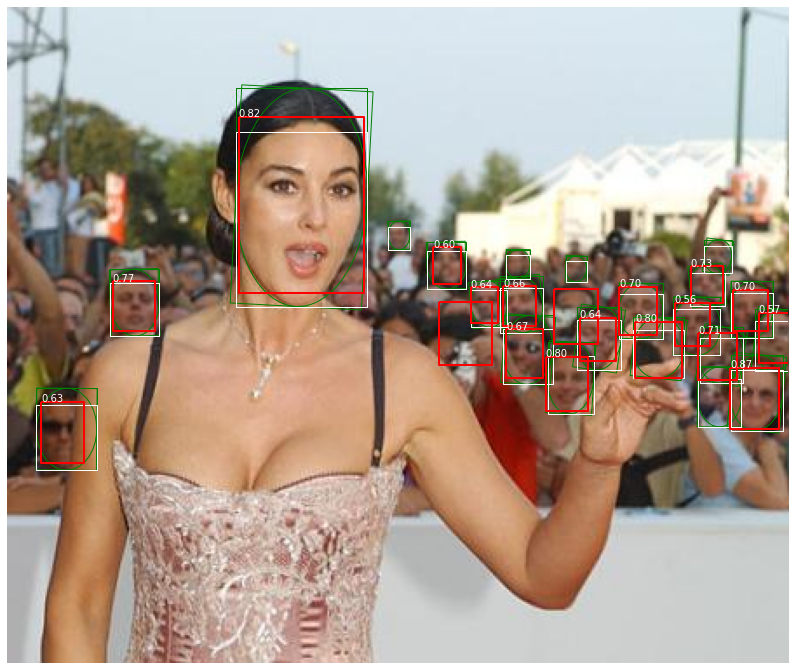

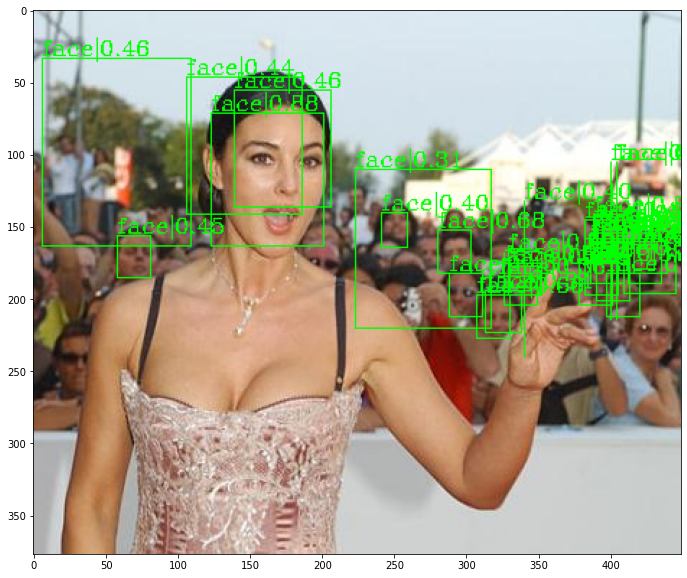

In [ ]:
i=2548
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
config_file = 'FDDB/flib/retina_101_32_FDDB.py' # lub wcześniejsze cfg
checkpoint_file = 'work_dirs/retina_101_32_FDDB/latest.pth'
img_path = metrics[i]['path']

detection_model = init_detector(cfg, checkpoint_file, device='cuda:0')
result = inference_detector(detection_model, img_path)
detection_model.CLASSES = datasets[0].CLASSES ###############################  !!!!!!!!!!!

result_plot(mt_res[i])
show_result_pyplot(img_path, result, datasets[0].CLASSES)


In [ ]:
!python mmdetection/tools/test.py  FDDB/flib/retina_101_32_FDDB.py work_dirs/retina_101_32_FDDB/latest.pth --out resultsRET.pkl
!python mmdetection/tools/voc_eval.py resultsRET.pkl FDDB/flib/retina_101_32_FDDB.py

[>>] 284/284, 7.3 task/s, elapsed: 39s, ETA:     0s
writing results to resultsRET.pkl

+-------+-----+-------+--------+-------+
| class | gts | dets  | recall | ap    |
+-------+-----+-------+--------+-------+
| face  | 551 | 25182 | 0.897  | 0.575 |
+-------+-----+-------+--------+-------+
| mAP   |     |       |        | 0.575 |
+-------+-----+-------+--------+-------+


In [ ]:
work_to_drive()

	zip warning: name not matched: DEBUG*.*
  adding: resultsRET.pkl (deflated 25%)


### [Spis treści](https://github.com/DarekGit/FACES_DNN/blob/master/notebooks/Praca_Dyplomowa.ipynb)

[5.4 Uwagi praktyczne](Uwagi_praktyczne.ipynb)